In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv("train.csv")

In [3]:
df.head()

,id,time,duration,feature_0,checkpoint,feature_1,feature_2,feature_3,feature_4,feature_5,...,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,target
0,eac9059b997a667954a1c2f19079c463,NaN,36 months,0.0,91th week,UT,130000.0,INDIVIDUAL,BAT3016651,0.0,...,D2,Debt consolidation,0.0,39779.0,5701.17,0.0,37400.0,Source Verified,841xx,28.0
1,f2bdbfe82b2a63a35726cb1a630af56a,NaN,36 months,0.0,4th week,LA,50000.0,INDIVIDUAL,BAT1184694,0.0,...,D2,Business,138.0,115674.0,11.84,0.0,49000.0,Verified,701xx,39.0
2,0a73ee5d7841b012f1fb62542d7664c7,NaN,36 months,0.0,65th week,VA,40000.0,INDIVIDUAL,BAT2078974,0.0,...,C1,Debt consolidation,0.0,40075.0,1689.09,0.0,17600.0,Verified,241xx,29.0
3,d9a39c969e294fe16601279e114fc9c0,< 1 year,60 months,0.0,9th week,MI,50000.0,INDIVIDUAL,BAT4106493,0.0,...,F2,Credit card refinancing,0.0,20459.0,348.68,0.0,20100.0,Source Verified,480xx,15.0
4,3a44d3ab14792dcc7aaf391db0bdb72c,5 years,36 months,0.0,139th week,NC,45000.0,INDIVIDUAL,,0.0,...,B5,debt consolidation,0.0,100987.0,2164.96,0.0,15000.0,Verified,282xx,18.0


In [4]:
df.describe()

,feature_0,feature_2,feature_5,feature_6,feature_7,feature_8,feature_10,feature_11,feature_15,feature_16,...,feature_22,feature_25,feature_26,feature_27,feature_30,feature_31,feature_32,feature_33,feature_34,target
count,419040.000000,4.190400e+05,419040.000000,419040.000000,419040.000000,419040.000000,419040.000000,419040.000000,419040.000000,419040.000000,...,419040.000000,419040.000000,4.190400e+05,418857.000000,4.190400e+05,4.190400e+05,419040.000000,419040.000000,4.190400e+05,419040.000000
mean,0.005329,7.548509e+04,4.141652,0.015765,0.328026,18.504864,14997.521418,14991.218903,0.669521,13.299535,...,0.208169,39.961678,1.712163e+04,55.223681,2.358979e+02,1.395292e+05,1692.512609,0.321974,3.205100e+04,25.510887
std,0.079510,6.460105e+04,51.673850,0.142355,0.879557,23.368626,8445.489865,8442.098986,0.956271,4.410936,...,0.587265,377.826759,2.226594e+04,23.481539,1.425897e+04,1.540478e+05,2009.691720,3.634503,3.557288e+04,11.844083
min,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,1000.000000,925.000000,0.000000,5.320000,...,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,2.000000
25%,0.000000,4.600000e+04,0.000000,0.000000,0.000000,12.180000,8400.000000,8400.000000,0.000000,9.990000,...,0.000000,0.000000,6.579000e+03,38.000000,0.000000e+00,2.985775e+04,421.730000,0.000000,1.400000e+04,17.000000
50%,0.000000,6.500000e+04,0.000000,0.000000,0.000000,17.970000,13500.000000,13500.000000,0.000000,12.990000,...,0.000000,0.000000,1.202500e+04,56.000000,0.000000e+00,8.061050e+04,1037.570000,0.000000,2.370000e+04,24.000000
75%,0.000000,9.000000e+04,0.000000,0.000000,0.000000,24.360000,20000.000000,20000.000000,1.000000,16.290000,...,0.000000,0.000000,2.106000e+04,73.400000,0.000000e+00,2.081768e+05,2168.445000,0.000000,3.980000e+04,32.000000
max,6.000000,9.000000e+06,5694.093600,20.000000,27.000000,9999.000000,35000.000000,35000.000000,7.000000,28.990000,...,49.000000,33520.270000,2.560703e+06,166.900000,9.152545e+06,8.000078e+06,21625.990000,242.550000,9.999999e+06,156.000000


In [5]:
df.dtypes

id             object
time           object
duration       object
feature_0     float64
checkpoint     object
feature_1      object
feature_2     float64
feature_3      object
feature_4      object
feature_5     float64
feature_6     float64
feature_7     float64
feature_8     float64
feature_9      object
feature_10      int64
feature_11    float64
feature_12     object
feature_13     object
feature_14     object
feature_15    float64
feature_16    float64
feature_17      int64
feature_18      int64
feature_19    float64
feature_20    float64
feature_21    float64
feature_22    float64
feature_23     object
feature_24     object
feature_25    float64
feature_26    float64
feature_27    float64
feature_28     object
feature_29     object
feature_30    float64
feature_31    float64
feature_32    float64
feature_33    float64
feature_34    float64
feature_35     object
feature_36     object
target        float64
dtype: object

In [6]:
#To find the duplicate columns in the dataframe
duplicate_columns = df.columns[df.columns.duplicated()]
duplicate_columns

Index([], dtype='object')

In [7]:
#To find the percentage of duplicate values in each column
df.isnull().sum()/len(df["id"])*100 

id             0.000000
time           5.247232
duration       0.000000
feature_0      0.000000
checkpoint     0.000000
feature_1      0.000000
feature_2      0.000000
feature_3      0.000000
feature_4     14.785701
feature_5      0.000000
feature_6      0.000000
feature_7      0.000000
feature_8      0.000000
feature_9      5.790378
feature_10     0.000000
feature_11     0.000000
feature_12     0.000000
feature_13     0.000000
feature_14     0.000000
feature_15     0.000000
feature_16     0.000000
feature_17     0.000000
feature_18     0.000000
feature_19    50.082092
feature_20    72.926212
feature_21    83.709192
feature_22     0.000000
feature_23     0.000000
feature_24     0.000000
feature_25     0.000000
feature_26     0.000000
feature_27     0.043671
feature_28     0.000000
feature_29     0.015750
feature_30     0.000000
feature_31     0.000000
feature_32     0.000000
feature_33     0.000000
feature_34     0.000000
feature_35     0.000000
feature_36     0.000000
target         0

From this we can see that feature 19, feature 20 and feature 21 have the most number of NA's. These are float values. We need to check their correlation with the target variable. 

In [8]:
print("The correlation between feature 19 and target is:",df['feature_19'].corr(df['target']))
print("The correlation between feature 20 and target is:",df['feature_20'].corr(df['target']))
print("The correlation between feature 21 and target is:",df['feature_21'].corr(df['target']))

The correlation between feature 19 and target is: -0.04608824619361266
The correlation between feature 20 and target is: -0.04803932743075116
The correlation between feature 21 and target is: -0.19981097144946847


We can see that the three variables dont have that much relation with target variable as their correlation value is close to zero. We can drop these columns

In [9]:
#remove_columns = [df["feature_19"],df["feature_20"],df["feature_21"]]
#df = df.drop(["feature_21"],axis = 1)
#df = df.drop(["feature_20"],axis = 1)
#df = df.drop(["feature_19"],axis = 1)

### Feature Understanding

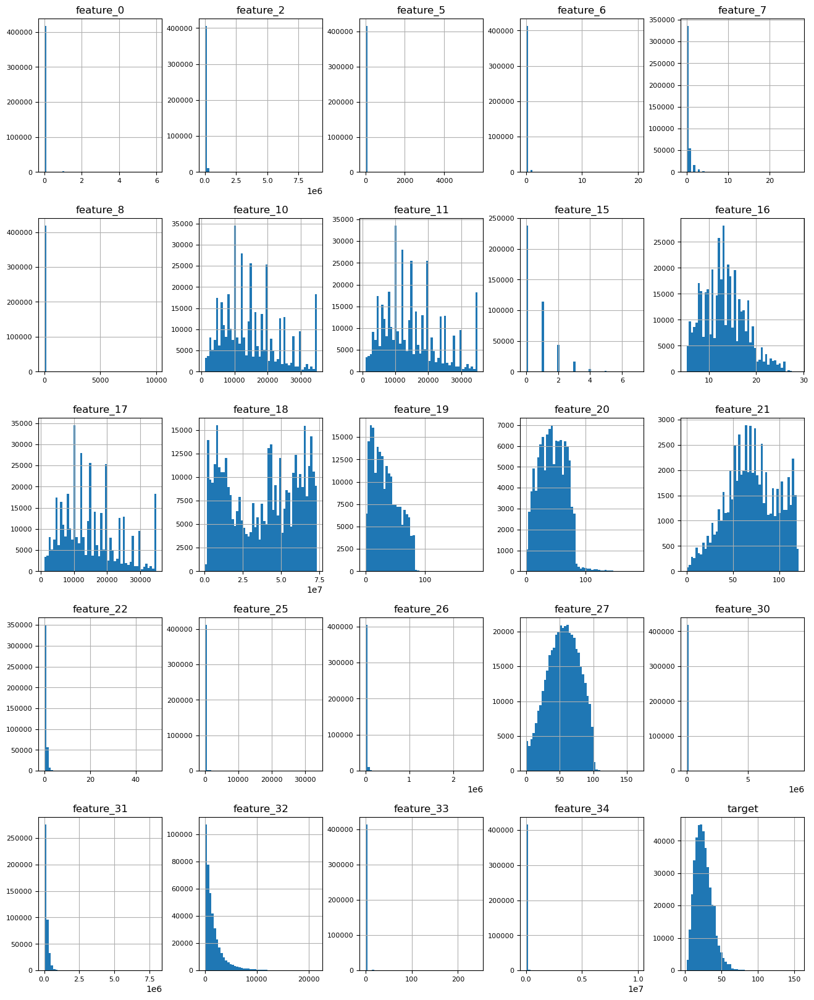

In [10]:
#plotting the correaltion matrix across all variables
df_num = df.select_dtypes(include = ['float64', 'int64'])
df_num.hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8);

Lets look at the distribution of the target variable in detail.

C:\Users\prith\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='target', ylabel='Density'>

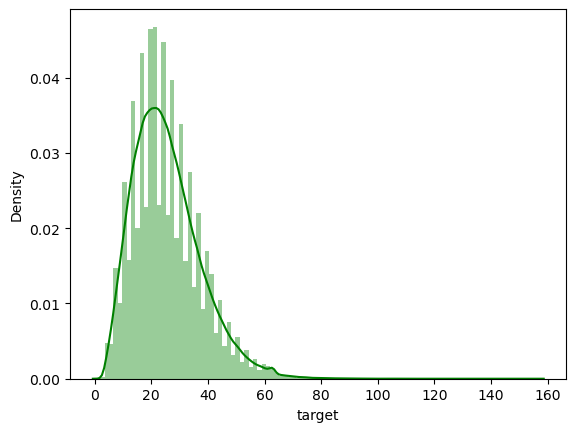

In [11]:
sns.distplot(df['target'],color = 'g',bins = 100,hist_kws = {'alpha':0.4})

Lets plot a correlation matrix across all the variables to know the correlation between each variables.

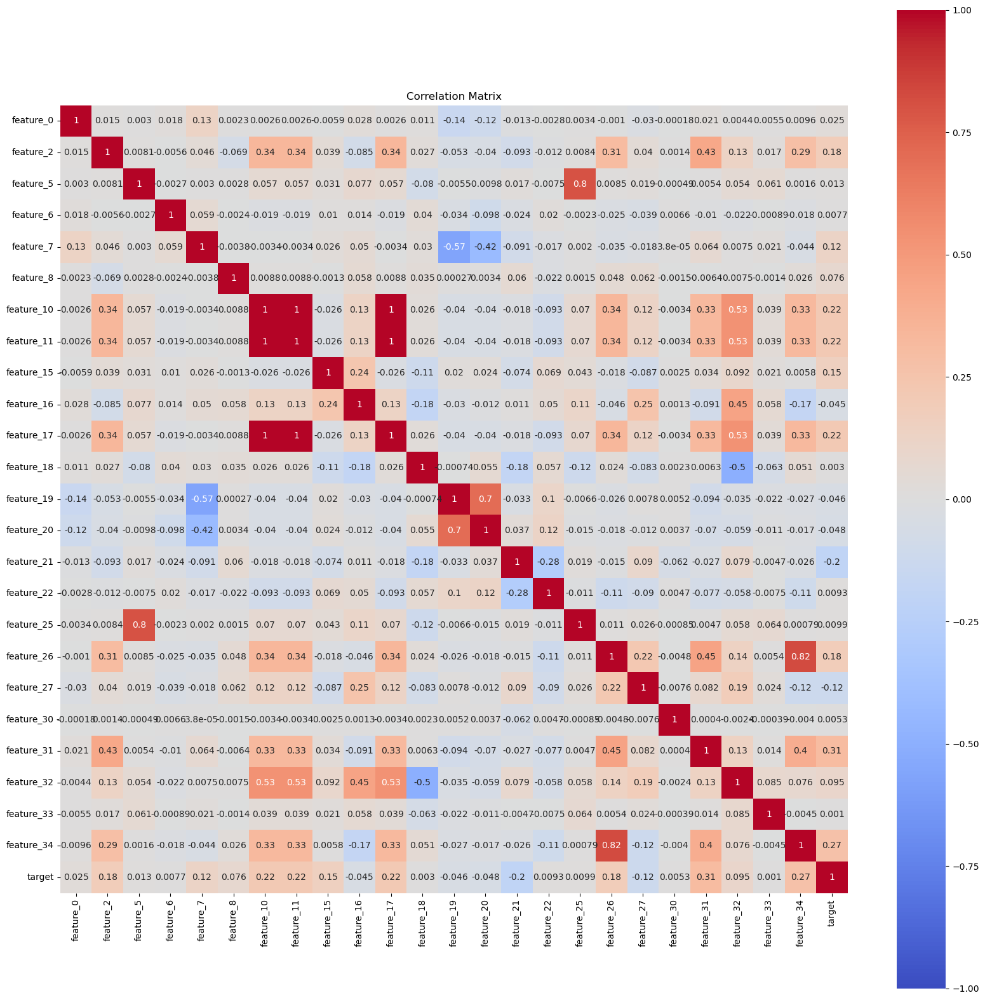

In [12]:
correlation_matrix = df.corr()
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0, square=True)
plt.title("Correlation Matrix")
plt.show()

From this we can see that the correlation between the elemets of features 10,11,17 are same so we can remove 11 and 17 from them |As none of the elements have a proper correlation with the output we have to use combination of variables for this

Text(0, 0.5, 'Count')

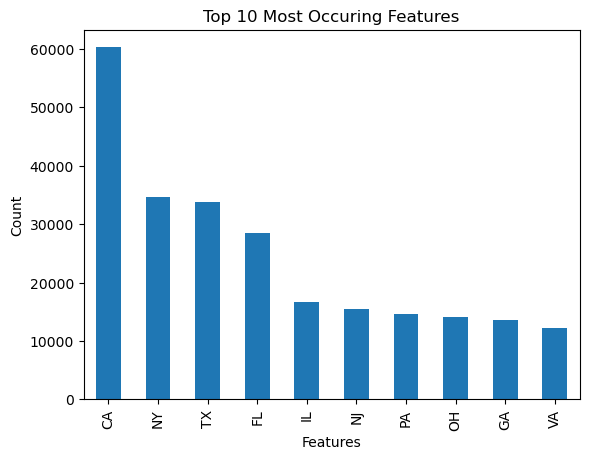

In [15]:
df['feature_1'].value_counts()
ax = df['feature_1'].value_counts().head(10).plot(kind='bar', title='Top 10 Most Occuring Features')
ax.set_xlabel('Features')
ax.set_ylabel('Count')

Text(0, 0.5, 'Count')

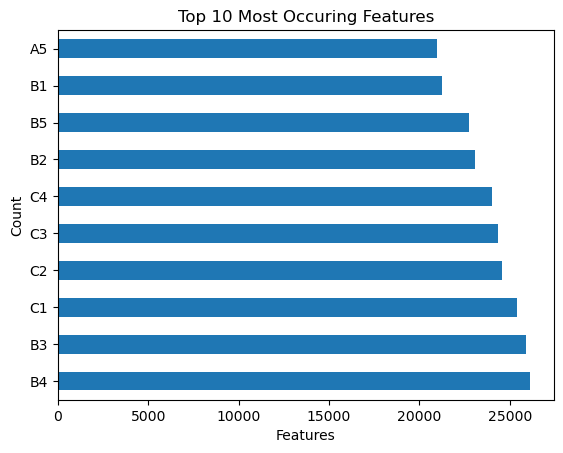

In [36]:
df["feature_28"].value_counts()
ax = df['feature_28'].value_counts().head(10).plot(kind='barh', title='Top 10 Most Occuring Features')
ax.set_xlabel('Features')
ax.set_ylabel('Count')

Text(0, 0.5, 'Count')

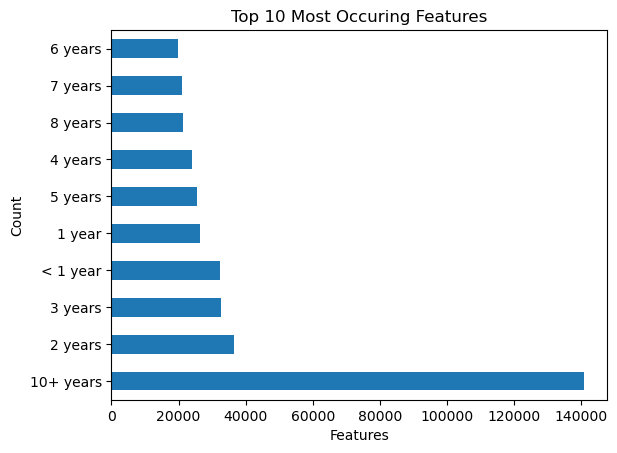

In [37]:
df["time"].value_counts()
ax = df['time'].value_counts().head(10).plot(kind='barh', title='Top 10 Most Occuring Features')
ax.set_xlabel('Features')
ax.set_ylabel('Count')

From this we can see most of the customers took loan for 36 months

C:\Users\prith\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


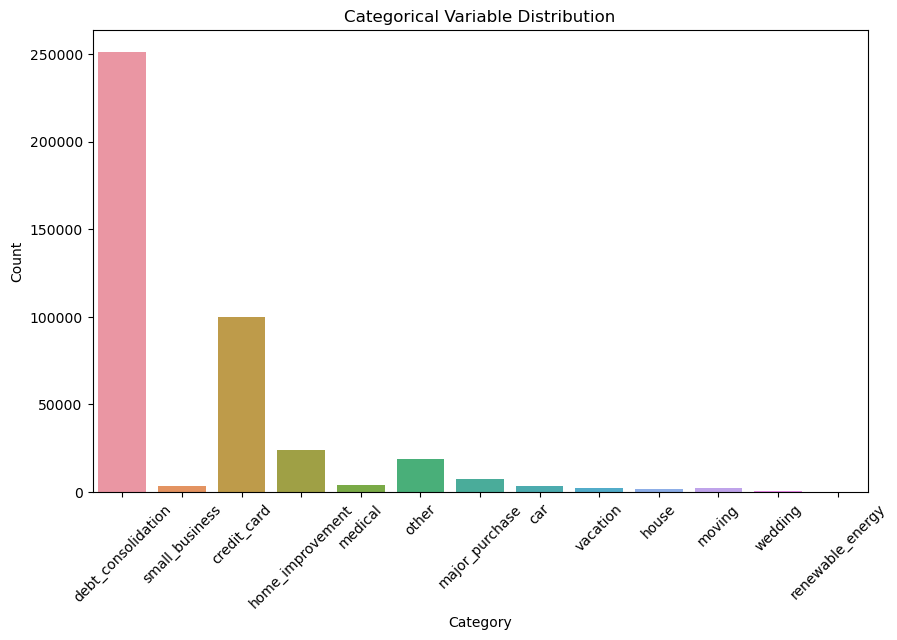

In [38]:
plt.figure(figsize=(10, 6))
sns.countplot(df['feature_23'])
plt.xlabel('Category')
plt.ylabel('Count')
plt.title('Categorical Variable Distribution')
plt.xticks(rotation=45)
plt.show()

We will be plotting all the categorical variables in a subplot

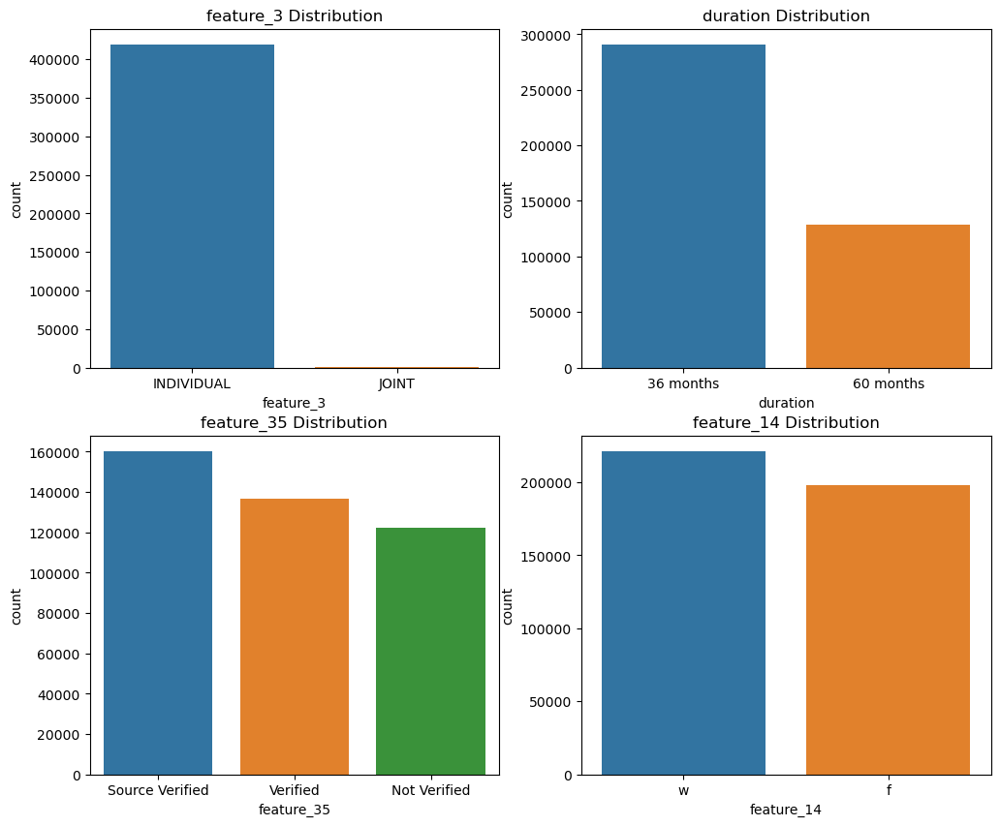

In [30]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.flatten()
for i, col in enumerate(['feature_3', 'duration','feature_35','feature_14']):
    sns.countplot(x=col, data=df, ax=axes[i])
    axes[i].set_title(f'{col} Distribution')

From the above graphs we can see that most of the customers who took the loan are from the state of "California" and have taken a loan for more than 10 years. Most of the customers have taken a loan for debt consolidation. 

Most of the customers have taken a induvidual loan over joint distribution and have taken the whole fund over a fraction. 

From the "feature_35" we can see that most of the entries are "not verified", we will check how the plot looks like without the not verified values. 



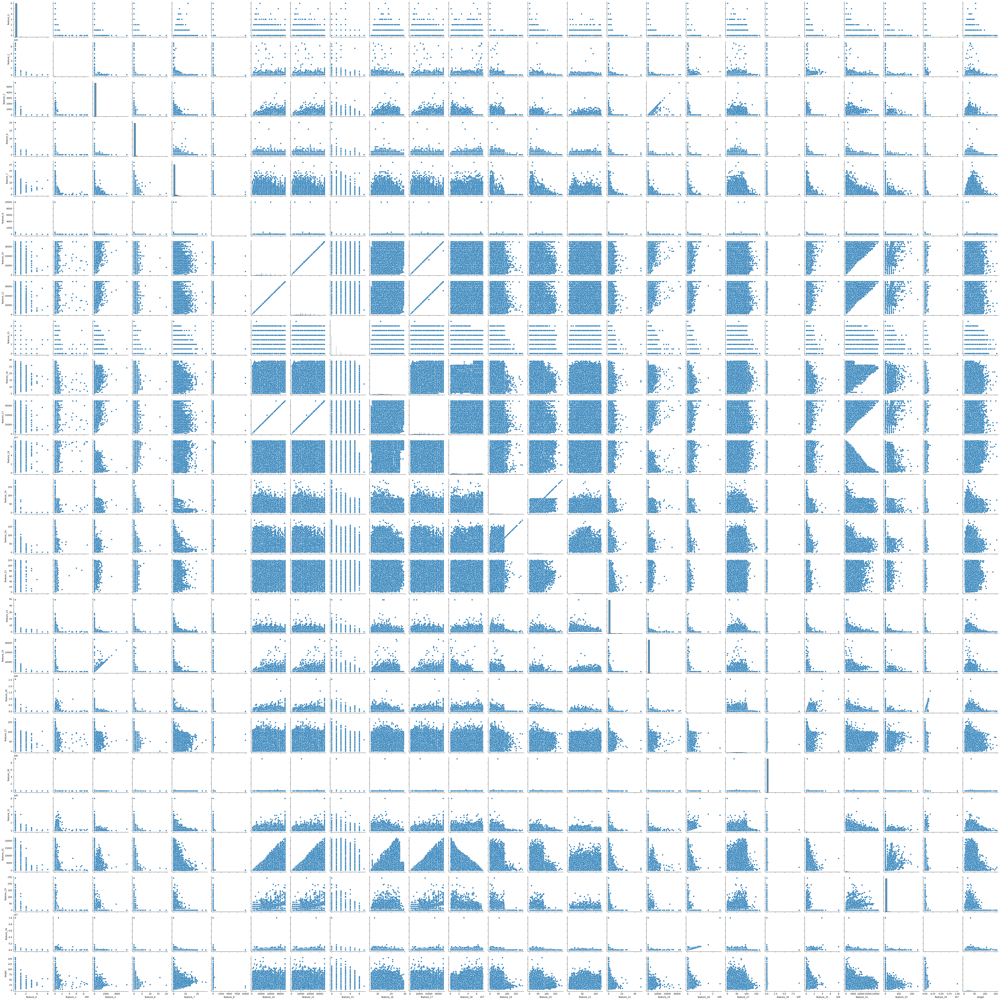

In [39]:
sns.pairplot(df_num)

From the model as well as the pairplot we can see that there is no strong correlation between the feature and the target variables so we cannot use standard linear regression model for this. 




There are some columns which require preprocessing as they are in a unsupported format. 

In [75]:
df["checkpoint"] = df["checkpoint"].transform(lambda x: x[:-7]) #splicing each cell in the dataset to remove last few cells
df['checkpoint'] = df['checkpoint'].fillna(0) #Replacing the NA column with zeros
df['checkpoint'] = df['checkpoint'].replace('NA','0') #Replacing the columnw with values 'NA' with zero.
df['checkpoint'] =  df['checkpoint'].astype(int)

ValueError: Function did not transform

In [76]:
df['duration'] = df['duration'].fillna(0) #removing the last 6 charecters of duration column
df['duration'] = df['duration'].transform(lambda x: x[:-6])  #removing the last 6 charecters of duration column
df['duration'] =  df['duration'].astype(int)

ValueError: Function did not transform

In [77]:
df['duration'] = df['duration'].transform(lambda x: x/12)

In [78]:
df['time'] = df['time'].replace('< 1 year','0.5 years') #reducing the value to 0.5 year
df['time'] = df['time'].replace('10+ years','11 years') #increasing the value to 11 years
df['time'] = df['time'].fillna('0 years') #replacing 'blank' cells with 'zero' years
df['time'] = df['time'].transform(lambda x: x[:-5]) 
df['time'] =  df['time'].astype(float)
df['feature_36'] = df['feature_36'].transform(lambda x: x[:-2])
df['feature_36'] =  df['feature_36'].astype(float)
df.drop(['feature_9','feature_12','feature_29'], inplace = True,axis = 1)

ValueError: Function did not transform

In [79]:
test_dataset = pd.read_csv("test.csv")
origTest_data = test_dataset

In [81]:
test_dataset["checkpoint"] = test_dataset["checkpoint"].transform(lambda x: x[:-7])
test_dataset['checkpoint'] = test_dataset['checkpoint'].fillna(0)
test_dataset['checkpoint'] = test_dataset['checkpoint'].replace('NA','0')
test_dataset['checkpoint'] =  test_dataset['checkpoint'].astype(int)
test_dataset['duration'] = test_dataset['duration'].fillna(0)
test_dataset['duration'] = test_dataset['duration'].transform(lambda x: x[:-6])
test_dataset['duration'] =  test_dataset['duration'].astype(int)
test_dataset['time'] = test_dataset['time'].replace('< 1 year','0.5 years')
test_dataset['time'] = test_dataset['time'].replace('10+ years','11 years')
test_dataset['time'] = test_dataset['time'].fillna('0 years')
test_dataset['time'] = test_dataset['time'].transform(lambda x: x[:-5])
test_dataset['time'] =  test_dataset['time'].astype(float)
test_dataset['feature_36'] = test_dataset['feature_36'].transform(lambda x: x[:-2])
test_dataset['feature_36'] =  test_dataset['feature_36'].astype(float)
test_dataset['feature_23'] = test_dataset['feature_23'].transform(lambda x: 'other' if x == 'educational' else x)
test_dataset.drop(['feature_9','feature_12','feature_29'], inplace = True,axis = 1)

ValueError: Function did not transform

In [82]:
test_dataset['feature_36']

0         900.0
1         549.0
2         111.0
3         430.0
4         190.0
          ...  
225632    957.0
225633     60.0
225634    112.0
225635    712.0
225636    810.0
Name: feature_36, Length: 225637, dtype: float64

In [86]:
from sklearn.preprocessing import LabelEncoder
lbl = LabelEncoder()
df['feature_23'] = lbl.fit_transform(df['feature_23'])
test_dataset['feature_23'] = lbl.transform(test_dataset['feature_23']) #One hot encoding the categorial variable
df['feature_4'] = lbl.fit_transform(df['feature_4'])
test_dataset['feature_4'] = lbl.transform(test_dataset['feature_4'])
df['feature_1'] = lbl.fit_transform(df['feature_1'])
test_dataset['feature_1'] = lbl.transform(test_dataset['feature_1'])
df['feature_28'] = lbl.fit_transform(df['feature_28'])
test_dataset['feature_28'] = lbl.transform(test_dataset['feature_28'])
df['feature_13'] = lbl.fit_transform(df['feature_13'])
test_dataset['feature_13'] = lbl.transform(test_dataset['feature_13'])
df['feature_3'] = lbl.fit_transform(df['feature_3'])
test_dataset['feature_3'] = lbl.transform(test_dataset['feature_3'])
df['feature_14'] = lbl.fit_transform(df['feature_14'])
test_dataset['feature_14'] = lbl.transform(test_dataset['feature_14'])
df['feature_24'] = lbl.fit_transform(df['feature_24'])
test_dataset['feature_24'] = lbl.transform(test_dataset['feature_24'])
df['feature_35'] = lbl.fit_transform(df['feature_35'])
test_dataset['feature_35'] = lbl.transform(test_dataset['feature_35'])

In [87]:
encoded_data = df.fillna(0)
X = np.array(encoded_data.drop(['target','id'],axis = 1))
Y = np.array(encoded_data['target'])

In [88]:
pip install --upgrade lightgbm

Note: you may need to restart the kernel to use updated packages.


In [89]:
import lightgbm as lgb #why do we use this when we are using Linear regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

X = np.array(encoded_data.drop(['target','id'], axis=1))
Y = np.array(encoded_data['target'])

X_train, X_val, y_train, y_val = train_test_split(X , Y, test_size=0.05, random_state=42)